<h1>BERT WEIGHTS</h1>
<h3>The purpose of this notebook is to explore the weights of BERT using the uncased version from HuggingFace.

## Contents

1. Weights distribution for query, key, values
2. Weights distribution for other layers
3. Attention score vs token per attention head
4. Attention score vs token per layer
5. Obserations

In [14]:
!pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Weights distribution for query, key, values

In [15]:
from transformers import AutoTokenizer, AutoModelForMaskedLM, AutoConfig
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
config = AutoConfig.from_pretrained("bert-base-uncased",output_hidden_states=True,output_attentions=True)
model = AutoModelForMaskedLM.from_pretrained("bert-base-uncased", config=config)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForMaskedLM: ['cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertForMaskedLM from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForMaskedLM from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [16]:
import os, sys

In [17]:
os.chdir("/content/transformers_deep_dive")
sys.path.append("model")
sys.path.append("utils")

In [18]:
from utils import graph

In [19]:
import seaborn as sns
import pandas as pd
sns.set(font_scale=3)

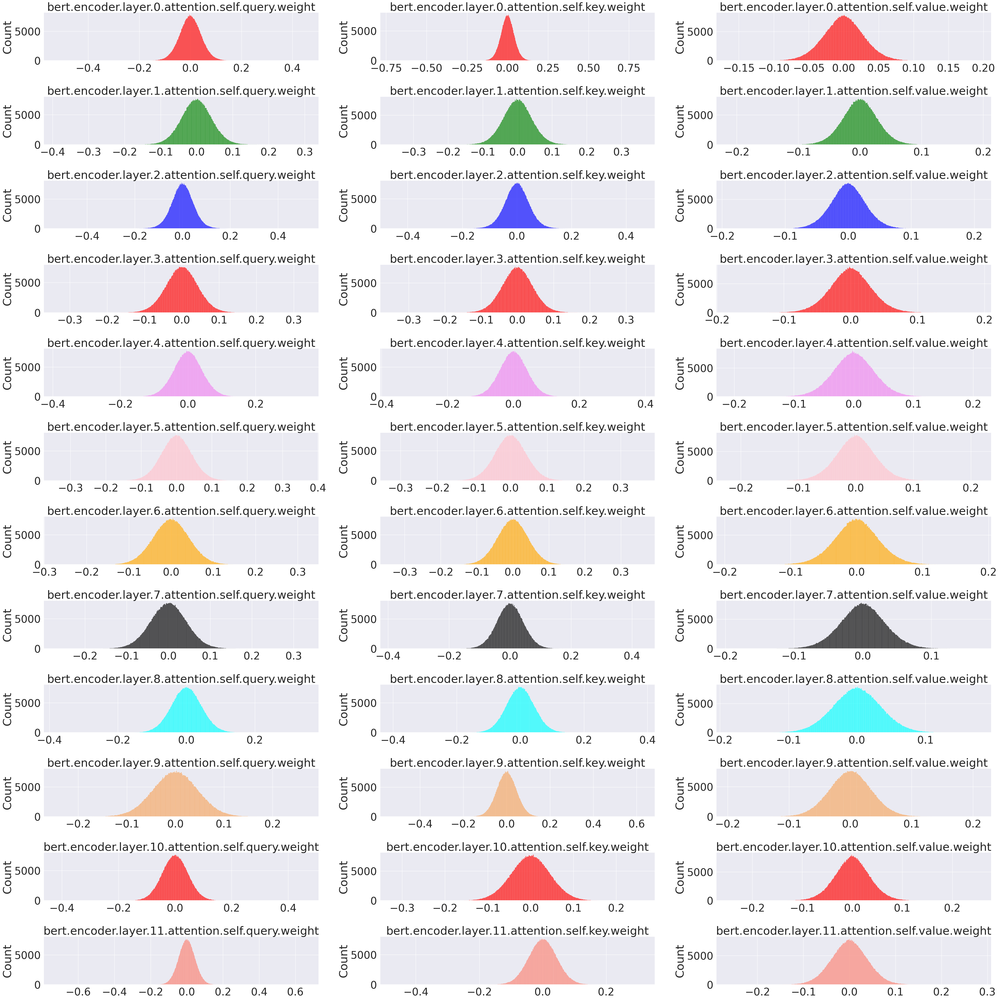

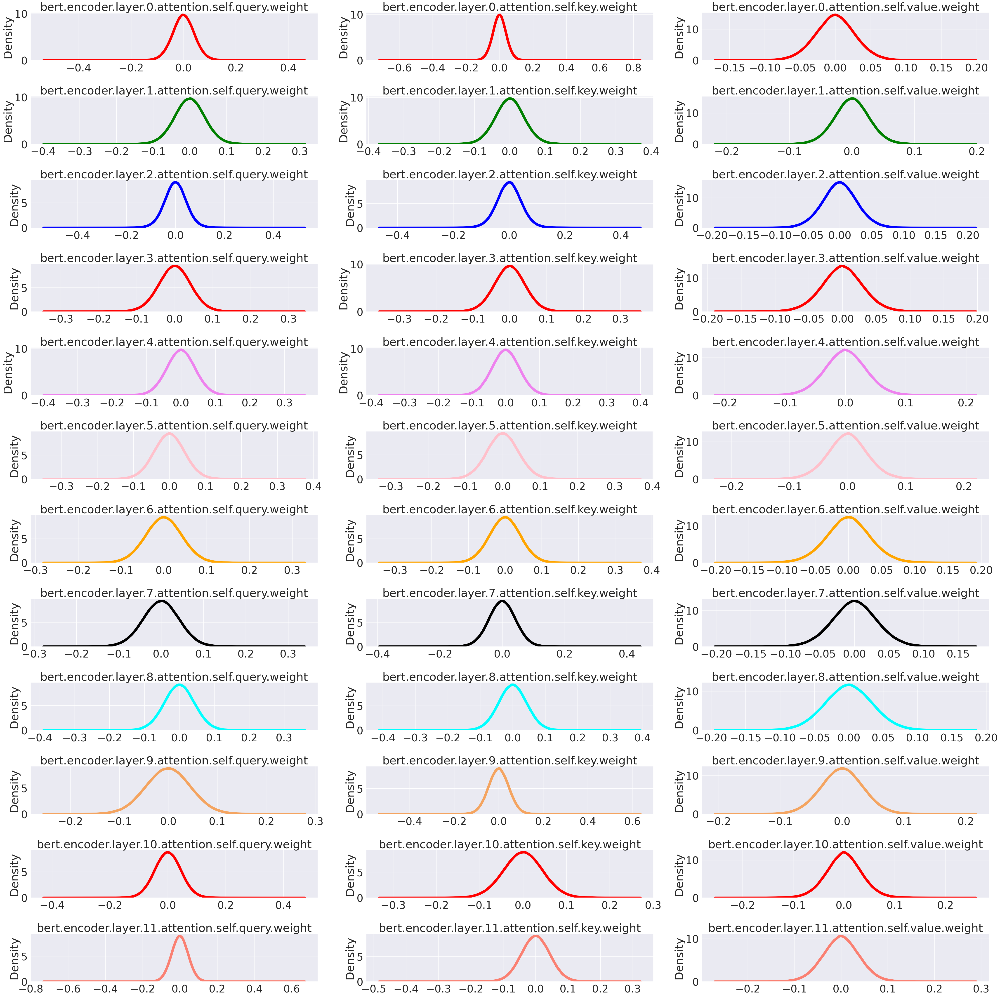

In [20]:
layer_wise_weights = model.state_dict()
layer_keys = [ y for i in range(0, 12)  for y in ['bert.encoder.layer.{}.attention.self.query.weight'.format(i),\
              'bert.encoder.layer.{}.attention.self.key.weight'.format(i),\
              'bert.encoder.layer.{}.attention.self.value.weight'.format(i)]]
h_args = {
    "layer_wise_weights":layer_wise_weights,
    "row_num":12,"col_num":3,"layer_keys":layer_keys,"method":graph.plot_hist,
}
graph.layer_wise_summary(**h_args)
h_args["method"] = graph.plot_kde
h_args["method_kwargs"] = {"linewidth":8.0}
graph.layer_wise_summary(**h_args)

##  Weights distribution for other layers

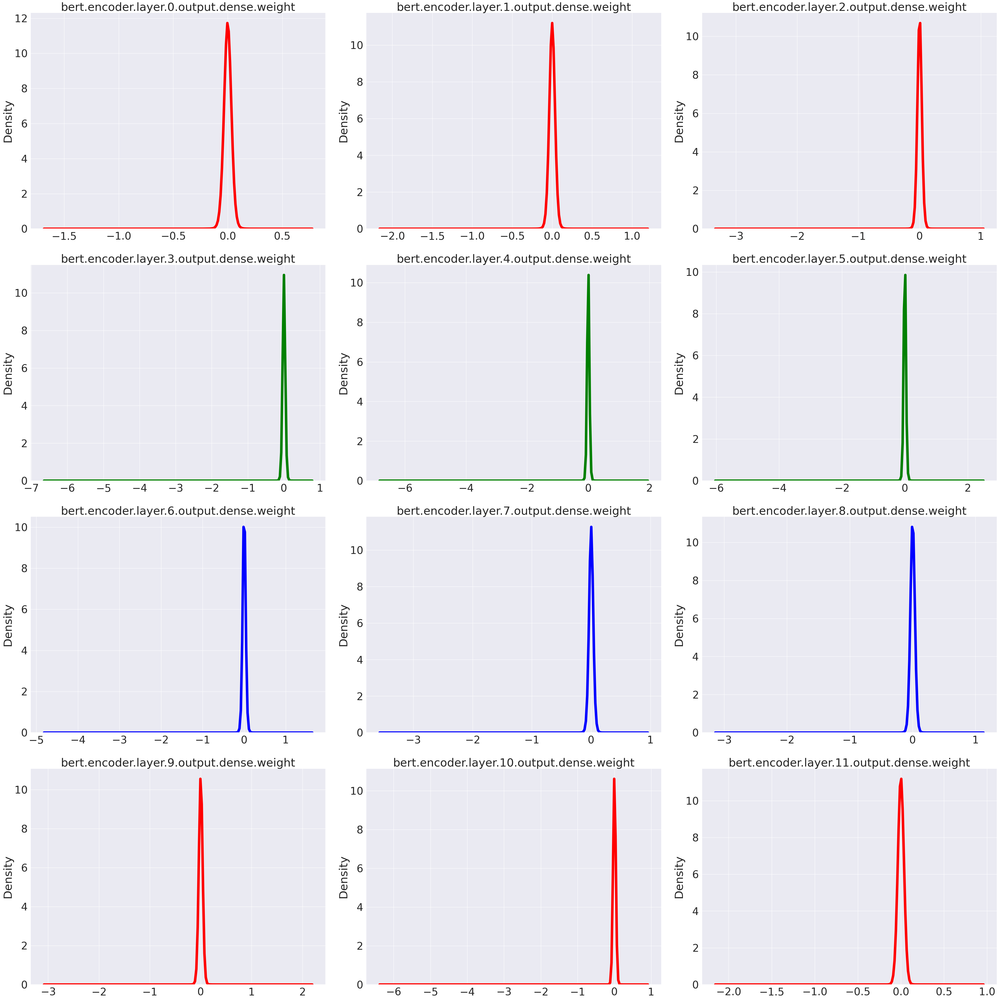

In [21]:
layer_keys = [ 'bert.encoder.layer.{}.output.dense.weight'.format(i) for i in range(0, 12)]

h_args["method"] = graph.plot_kde
h_args["method_kwargs"] = {"linewidth":8.0}
h_args["layer_keys"] = layer_keys
h_args["row_num"] = 4

graph.layer_wise_summary(**h_args)

## Attention score vs token per attention head

In [22]:
import torch
import numpy as np
sentence = ["The","elves","prepared","a","delicious","[MASK]","to","celebrate","spring"]
tokenized_input = tokenizer(sentence,is_split_into_words=True,return_tensors='pt')
for each_id in tokenized_input["input_ids"][0]:
  print(tokenizer.decode(each_id))

model.eval()
with torch.no_grad():
  output = model(**tokenized_input)
print(output.keys())
print(output["attentions"][0].shape)


probs = torch.nn.functional.softmax(output.logits, dim=-1)
probs_index = torch.argmax(probs, dim=-1)
mask_id = torch.where(tokenized_input["input_ids"]==103)

print("Predicted = ", tokenizer.decode( probs_index[0][mask_id[1][0].item()]))

[CLS]
the
elves
prepared
a
delicious
[MASK]
to
celebrate
spring
[SEP]
odict_keys(['logits', 'hidden_states', 'attentions'])
torch.Size([1, 12, 11, 11])
Predicted =  feast


In [23]:
attentions = output["attentions"] #Shape is 12, 1, 12, 11, 11
print(attentions[0].shape)                #Attn layers, batch size, attn heads, #tokens, #tokens

torch.Size([1, 12, 11, 11])


<p>You can change the value for token_index and see attention score visualizations for the different tokens. Right now, the graphs for token_index = 6 is shown, which means these are the attention scores computed for the [MASK] token. 

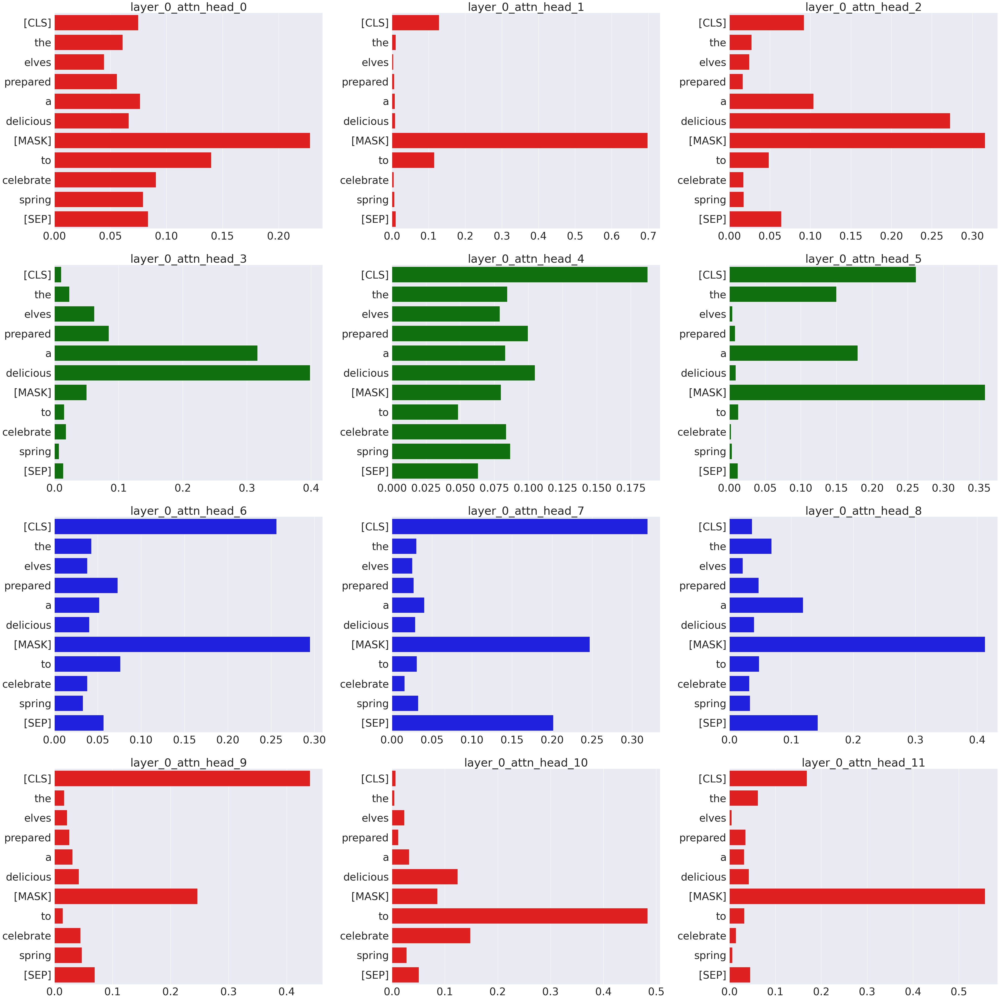

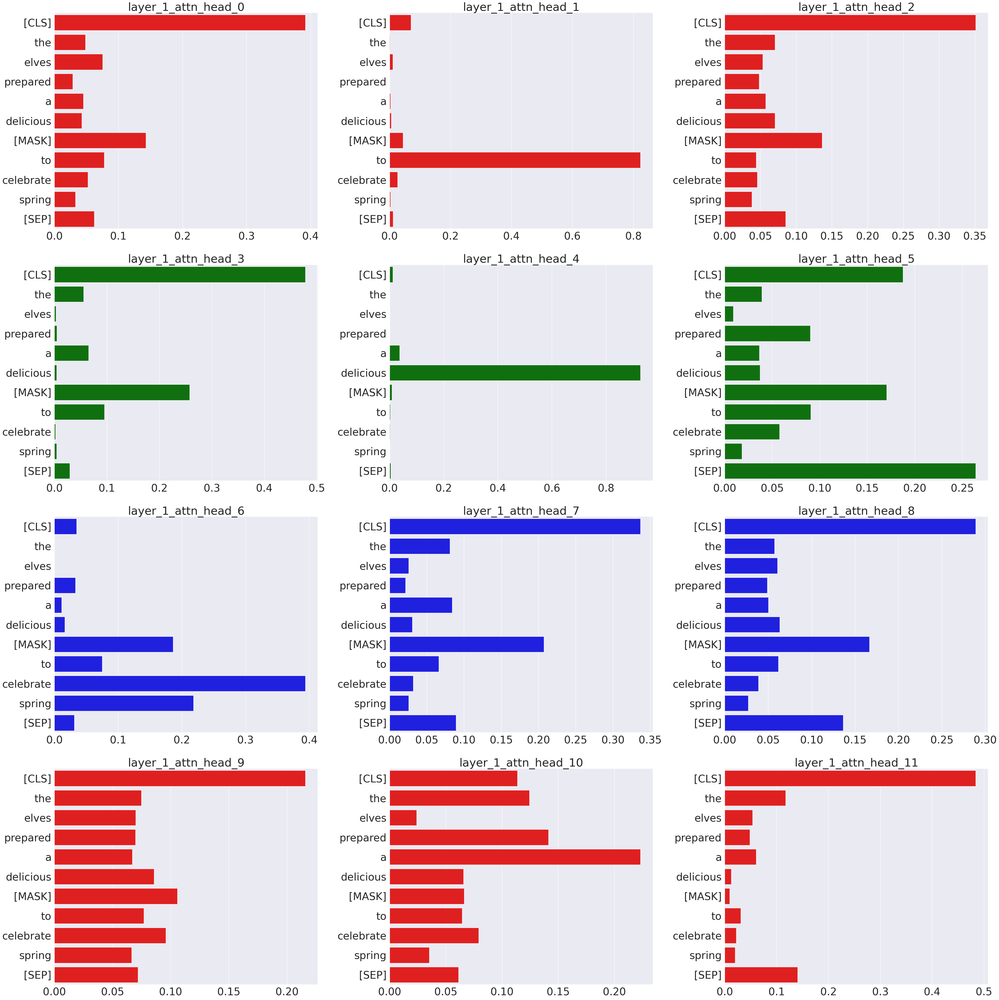

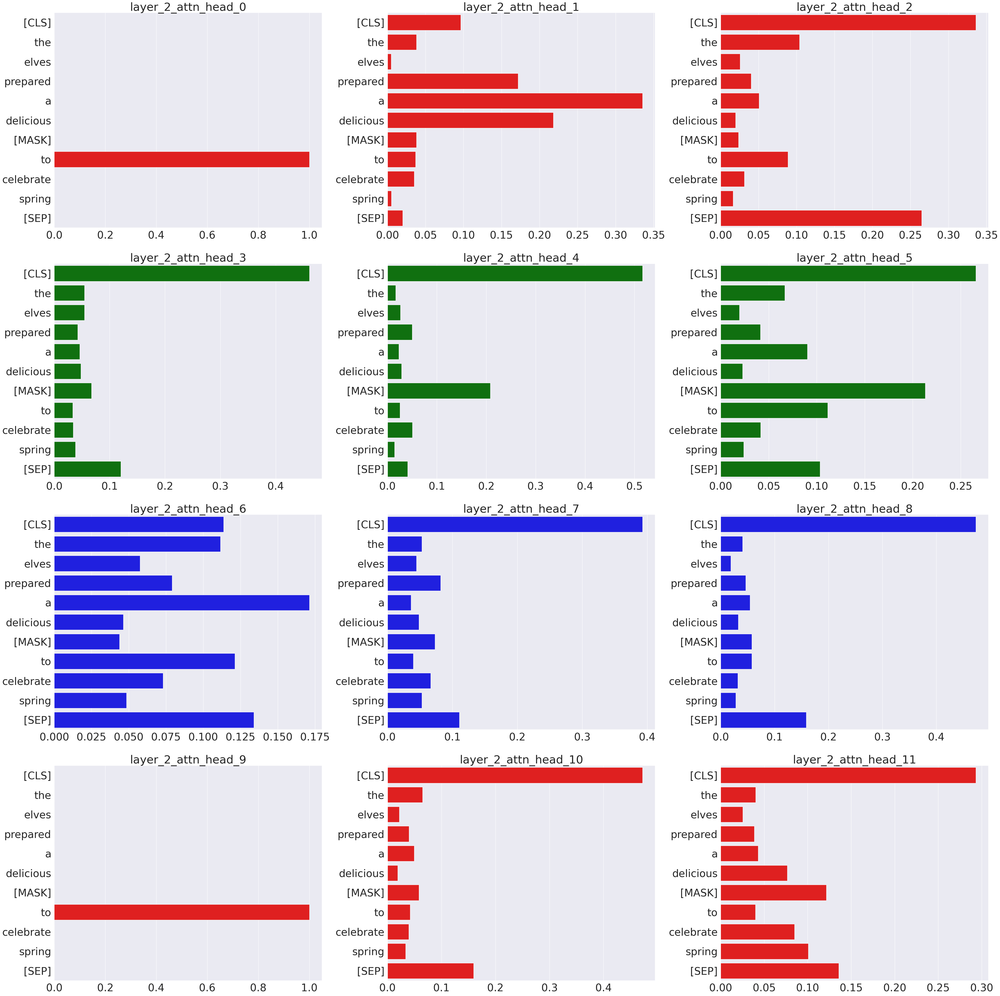

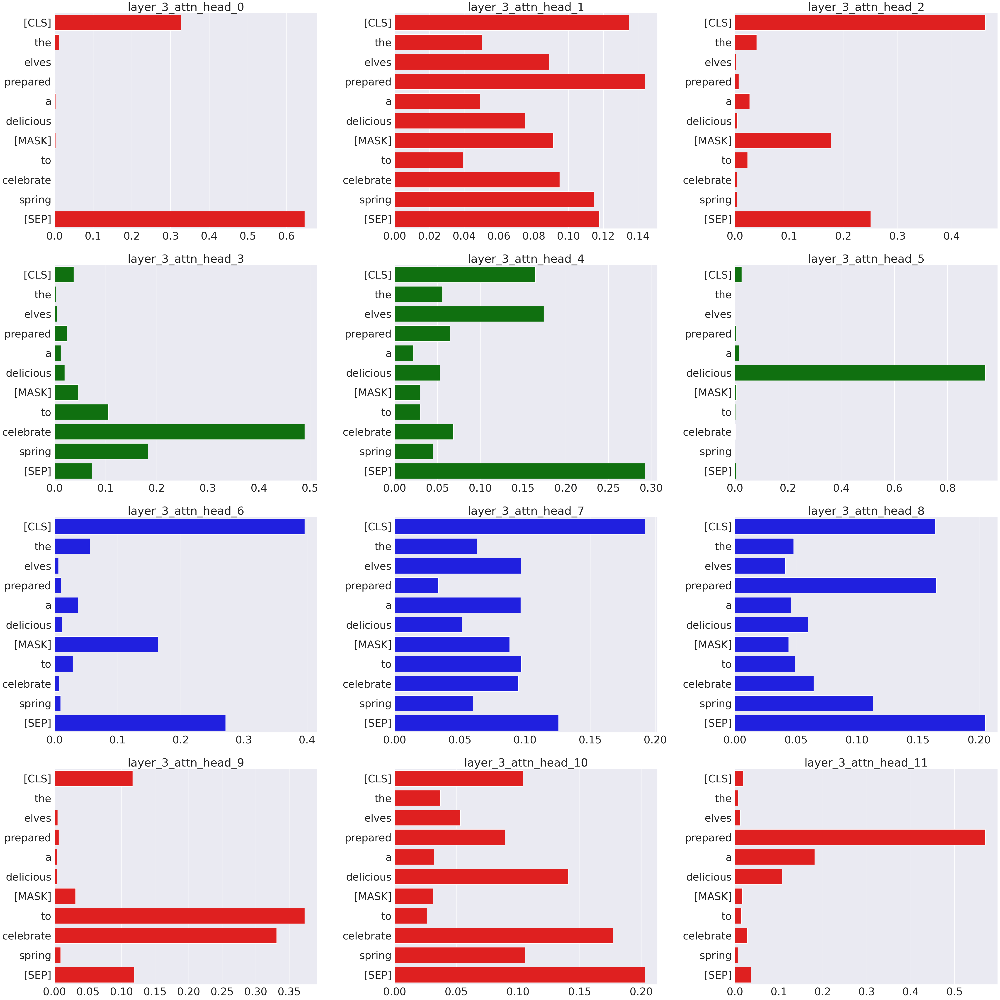

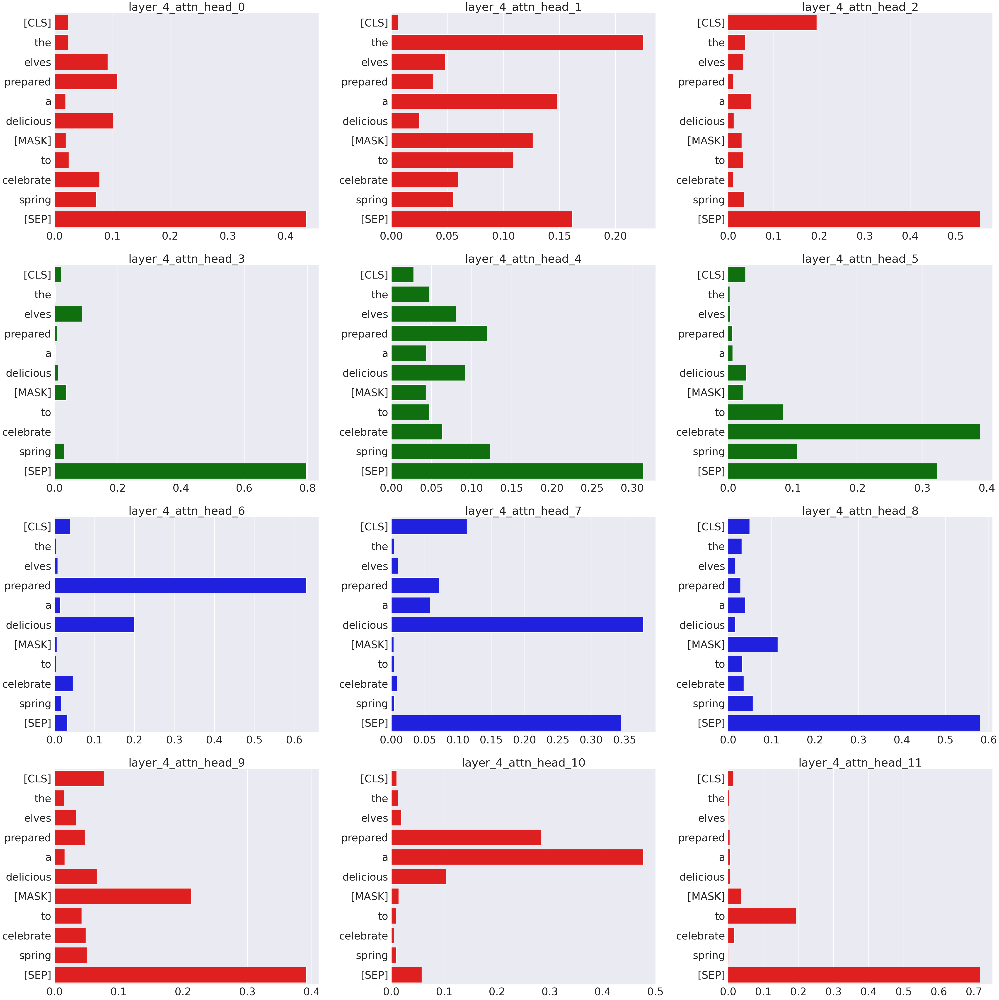

...

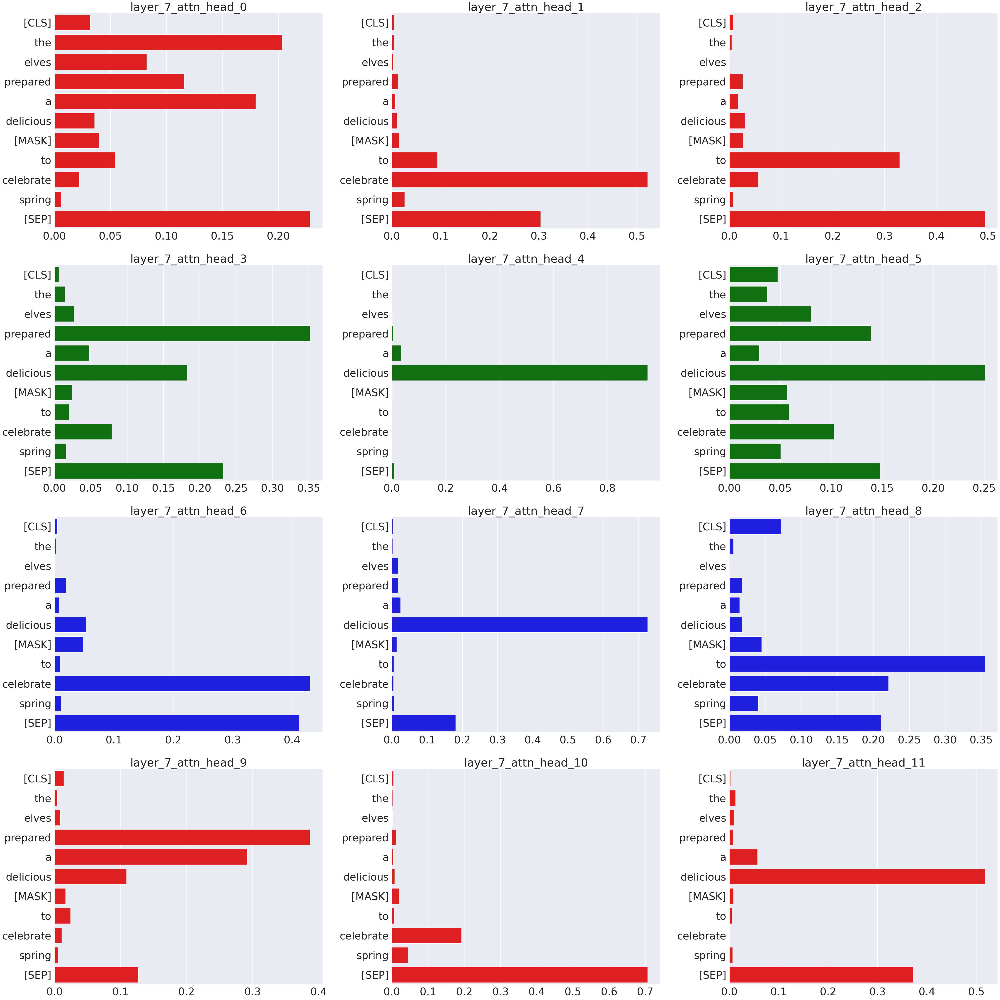

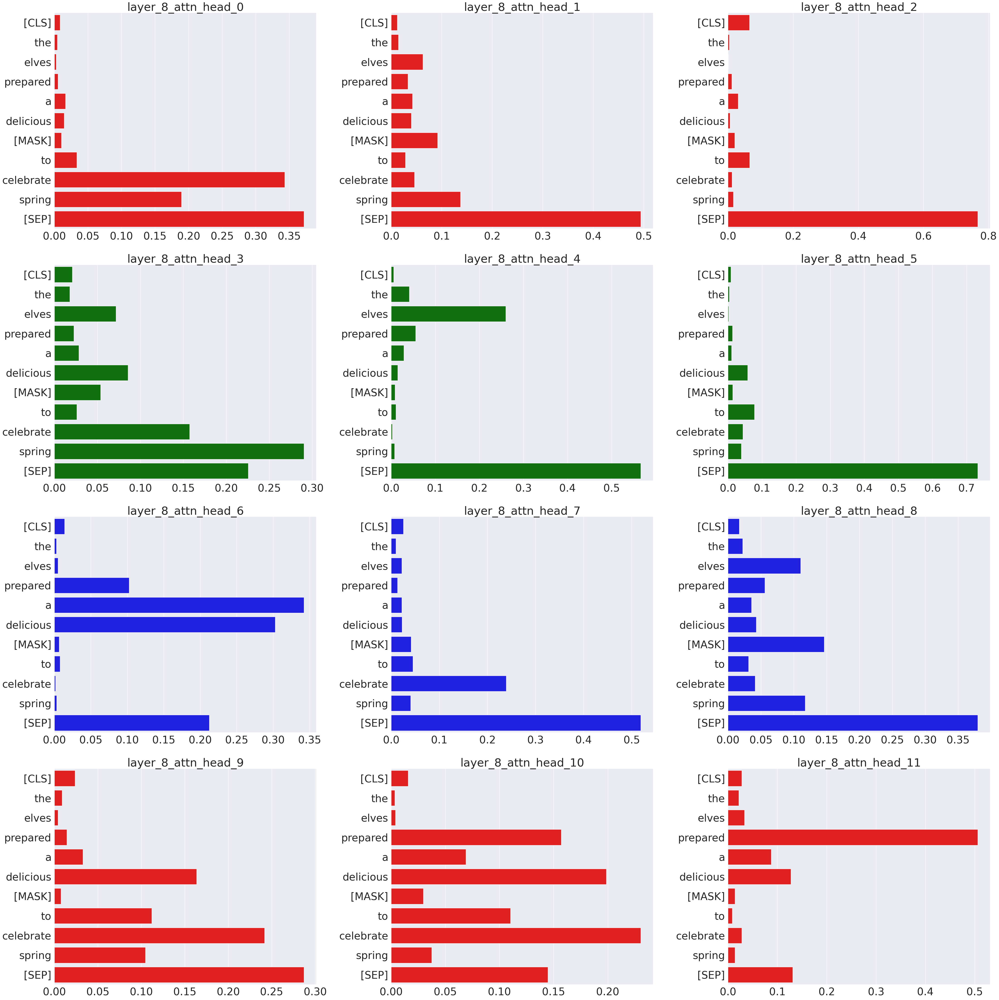

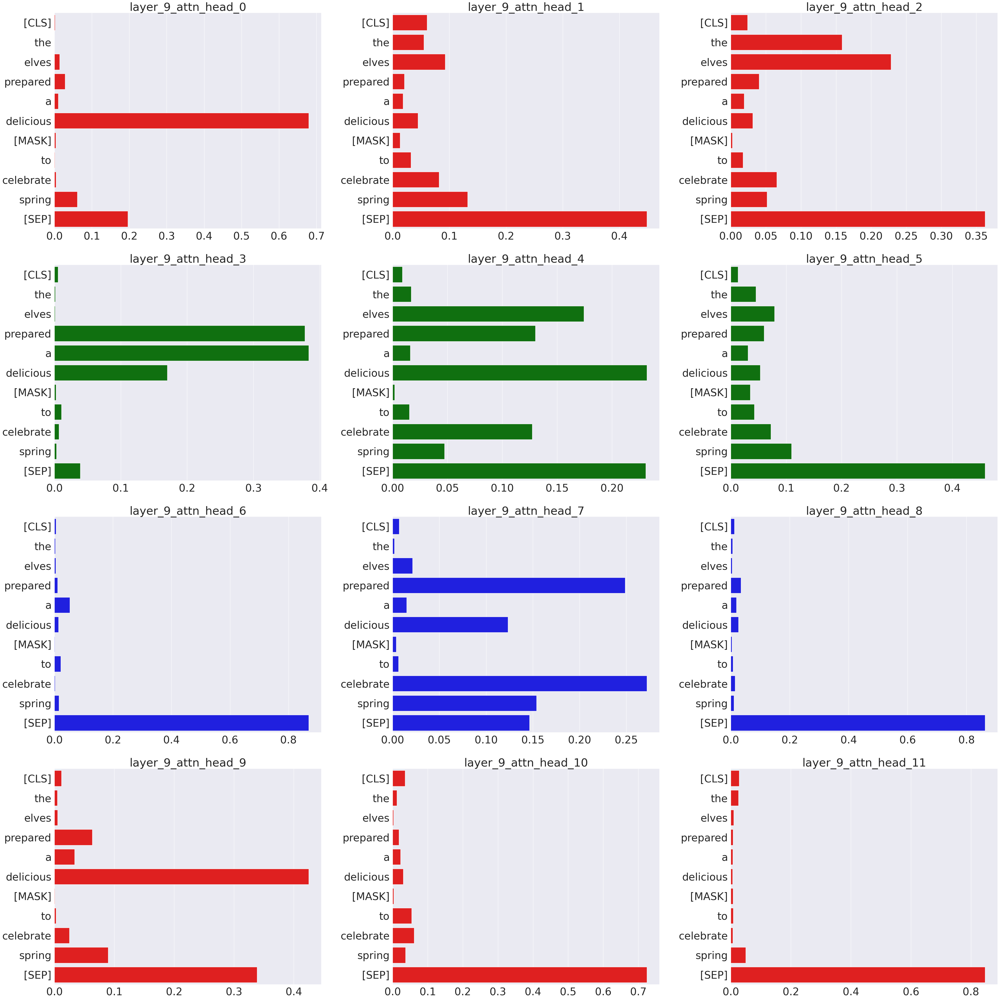

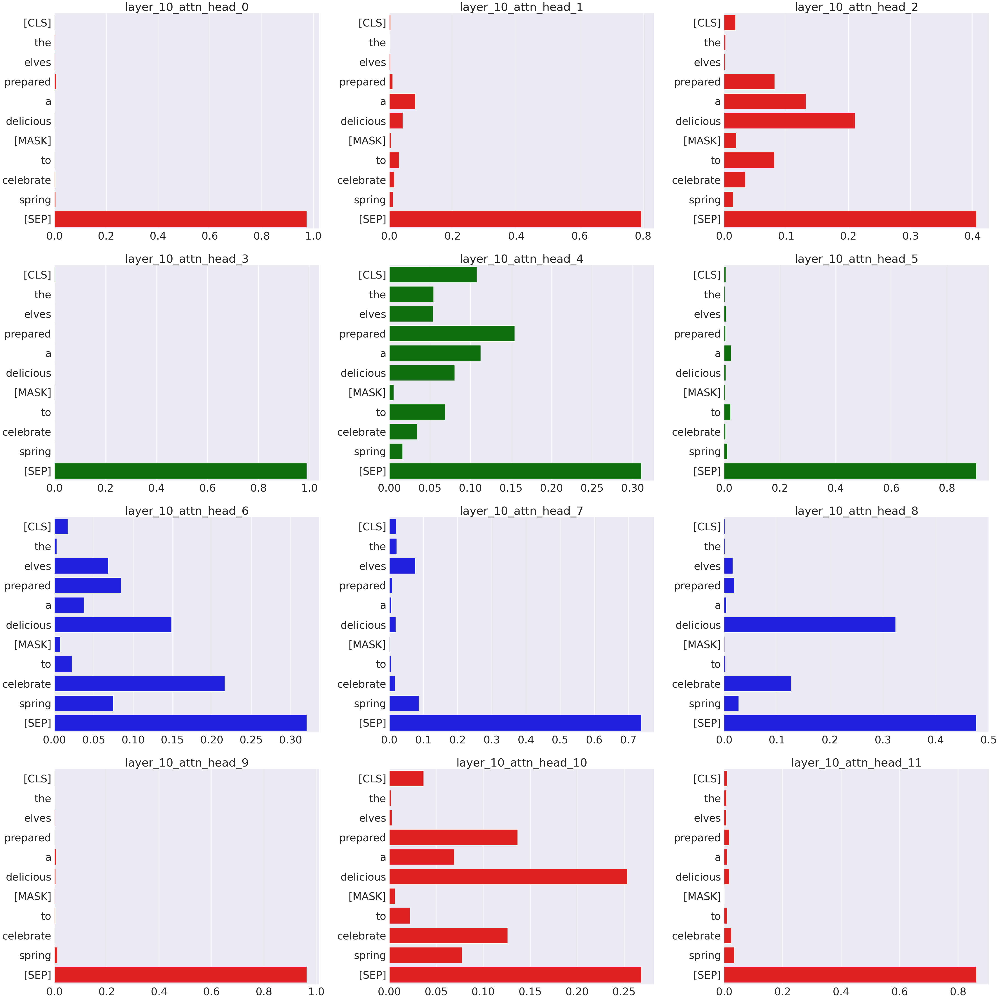

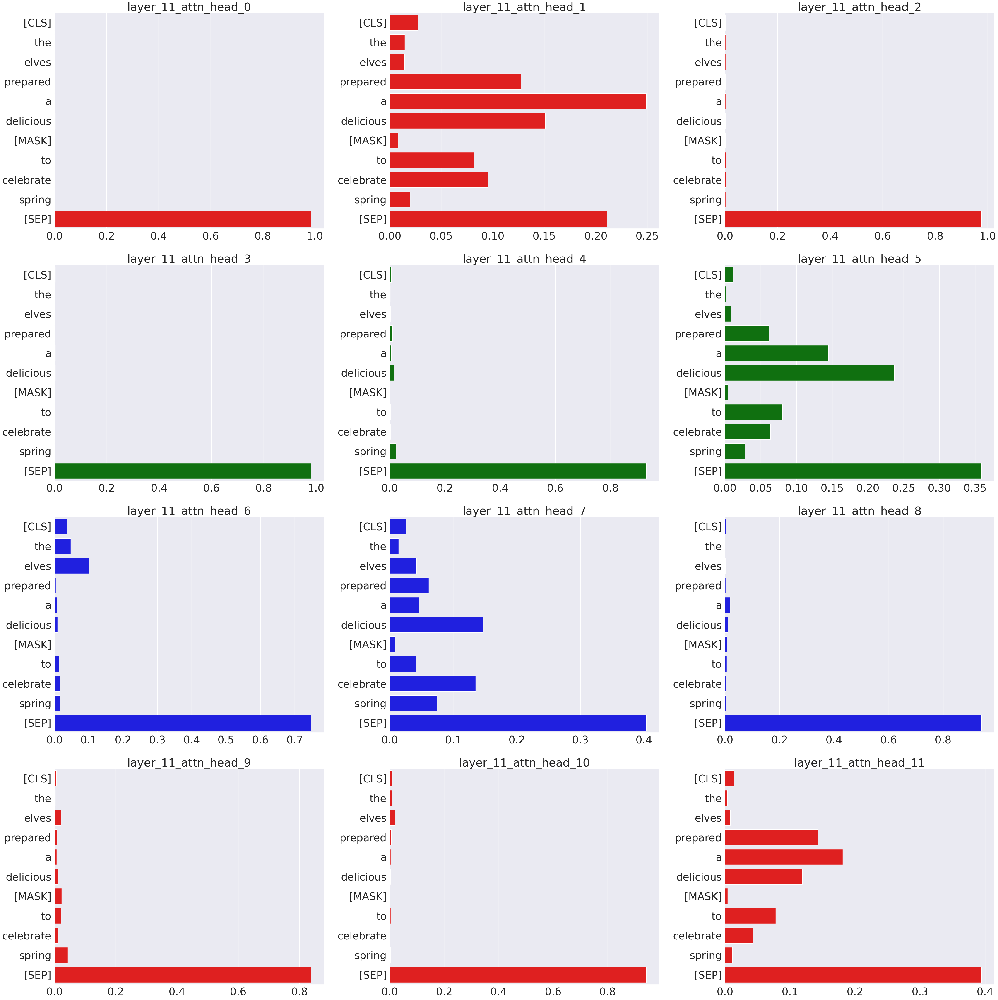

In [24]:
x_labels = [tokenizer.decode(each_id) for each_id in tokenized_input["input_ids"][0]]
token_index = 6
for index, each_att_layer in enumerate(attentions):
  attn_heads = each_att_layer[0]
  layer_keys = ['layer_{}_attn_head_{}'.format(index,i) for i in range(0,12)]
  layer_wise_weights = attn_heads[:, token_index,:]
  layer_wise_weights = dict(zip(layer_keys, layer_wise_weights))
  h_args = {
      "layer_wise_weights":layer_wise_weights,
      "layer_keys":layer_keys, "row_num":4,"col_num":3,"method":graph.plot_barplot,"method_kwargs":{"y":x_labels}
  }
  graph.layer_wise_summary(**h_args)
  

## Attention score vs token per layer

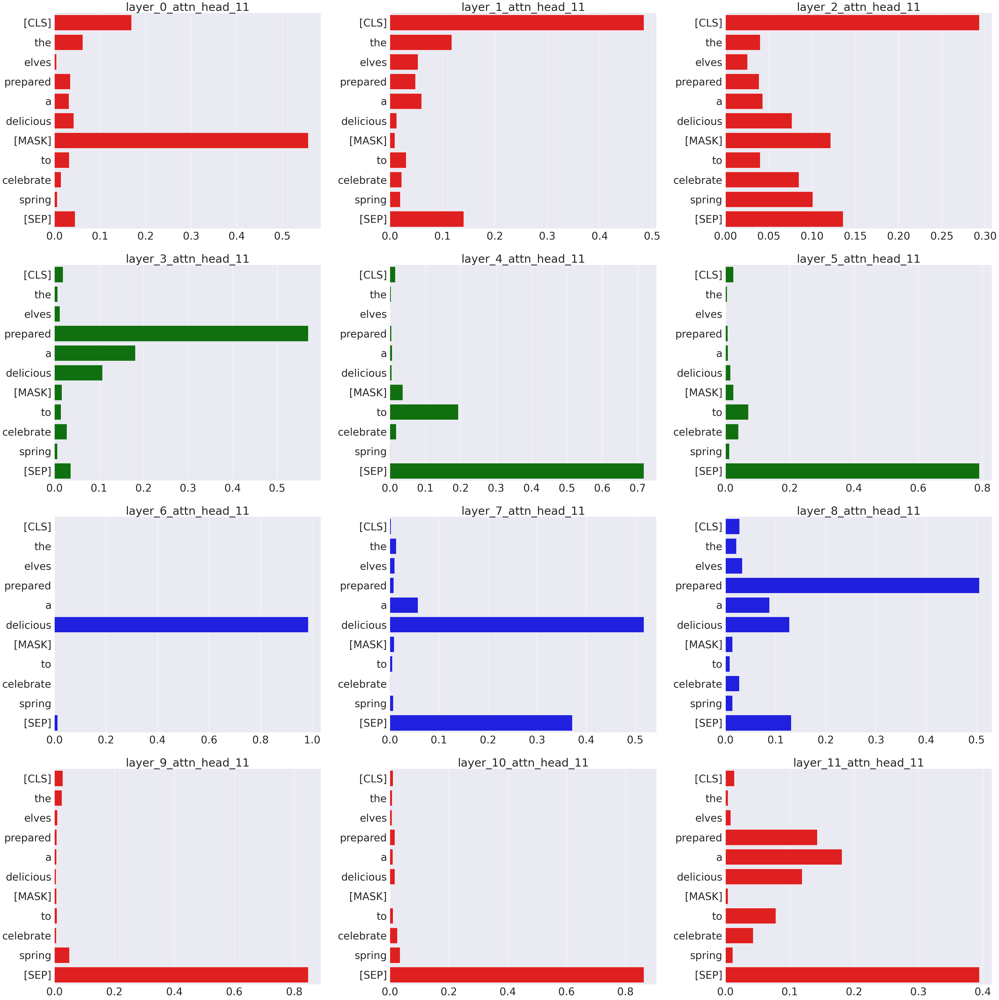

In [25]:
attentions = torch.stack(attentions)
layer_keys = ['layer_{}_attn_head_11'.format(i) for i in range(0,12)]
layer_wise_weights = attentions[:,0,11,token_index,:]
layer_wise_weights = dict(zip(layer_keys, layer_wise_weights))
h_args = {
      "layer_wise_weights":layer_wise_weights,
      "layer_keys":layer_keys, "row_num":4,"col_num":3,"method":graph.plot_barplot,"method_kwargs":{"y":x_labels}
  }
graph.layer_wise_summary(**h_args)

## Observations


<h4>[ Note - I'm referring to layer numbers with zero-based indexing so layer 1 is referred as layer 0 and so on ]
<p></h4>

<h4>[ Note - Attention score graphs for [MASK token is shown, for other tokens, set token_index to get the required visualization ]
<p></h4>

<b><h4>What is the last attention head trying to figure out?</h4></b>
  <h4><li>If we visualize the last attention head for each layer for selected tokens (like [MASK], celebrate, elves and delicious) we see that in later layers - like layers 9, 10, 11 maximum attention is placed on the end of the sequence, that is, on the [SEP] token</li>
  <li>Intermediate layers are highlighting verb or adjective relationship for the selected token. For example, last attention head for [MASK] token assigns largest attention score to "delicious" in layer 6, 7 (delicious is adjective for the [MASK]) and highest score to "prepared" in layer 3,8 ([MASK] is the object for the verb prepared )
  </li>
  <li>Similarly, for the token celebrate, last attention head focuses on spring in layer 4 where spring is the object of the verb celebrate</li>
  </ul></h4>

  <b><h4>What about the attention heads per layer?</h4></b>
  <h4><li>
  All later attention heads like heads 10, 11 are focusing on [SEP] token across layers
  </li>
  <li>
  A lot of attention heads in earlier layers like layer 1 are focusing on the [CLS] token as seeen when visualizing for different tokens like [MASK], elves and celebrate 
  </li>
  <li>
  Attention scores in attention heads in earlier layers(layer0,1) look spread out across different tokens but in later layers(layer5,6) different heads are all focusing on the same token.</li>
<li>For example, for [MASK] token, layer 5,6 is focusing on delicious(layer 5 heads 1,10, layer 6 heads 4,11), prepared(layer 6 heads 3,5,9,10), "a","to" and SEP. So attention heads in layer 5,6 are mostly looking at --> delicious, prepared, "a", "to" and SEP.

<li>For [MASK] token, different heads in layer 0,1 are focusing on [MASK], [CLS], [SEP], "a", delicious, "to", celebrate.</li>

<li>For token "elves", layers 5,6 are only focusing on prepared(layer 5 head 9), spring(layer 6 head 7) and SEP(all heads in layers 5,6 other than head 9 and 7) whereas layers 0,1 are focusing on [CLS], [SEP], [MASK], delicious, celebrate, a, the, elves

<li>Finally, if we look at "celebrate", layers 5, 6 are focusing on [MASK], spring, to and [SEP] whereas layers 0, 1 are focusing on [MASK], elves, prepared, delicious, celebrate, spring, [CLS]
</p></h4>